## Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import uniform

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.utils.class_weight import compute_class_weight
from sklearn.datasets import load_boston

import tensorflow as tf

from tensorflow.keras import Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

## Preprocessing


In [2]:
# Read Data

boston = load_boston()

df = pd.DataFrame(boston.data)
df.columns = boston.feature_names
df['PRICE'] = boston.target 

In [3]:
df.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


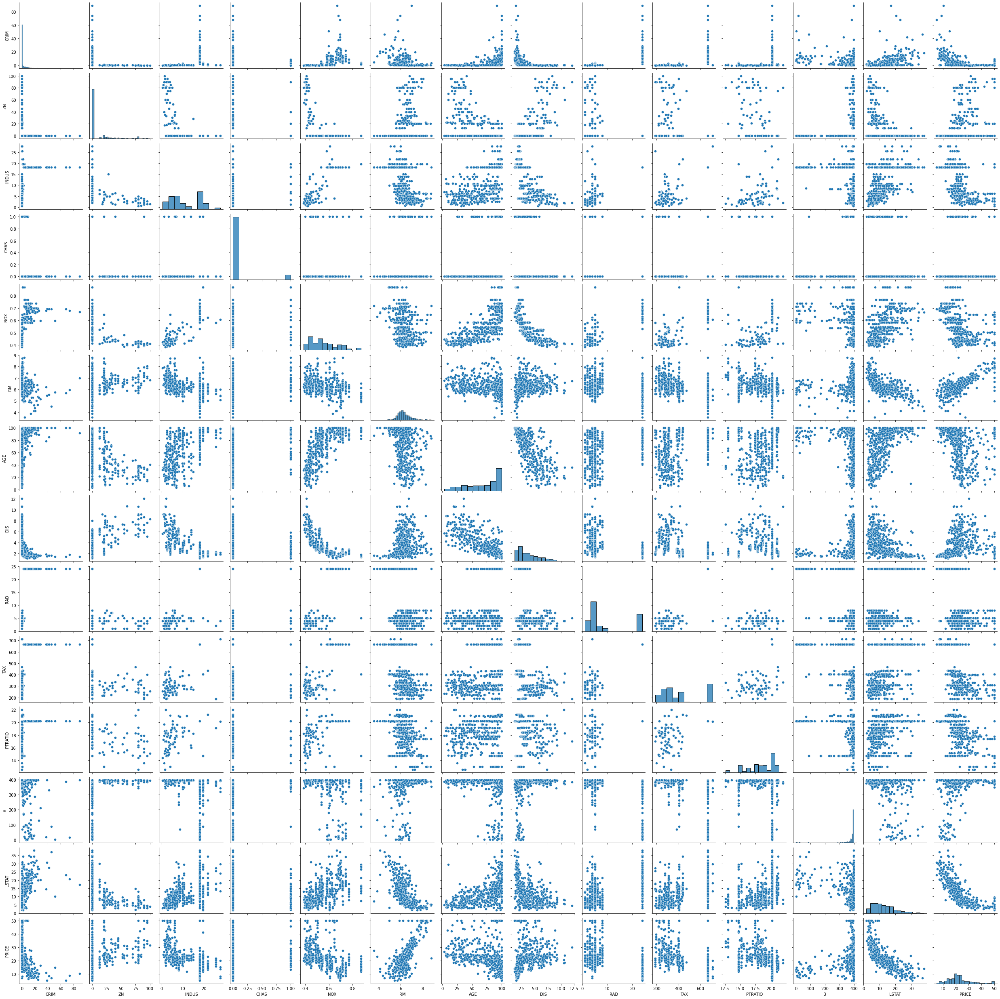

In [4]:
sns.pairplot(df)

In [5]:
# Split Dataset

X = df.drop('PRICE', axis=1).values
y = df.PRICE.values

print(X.shape)
print(y.shape)

(506, 13)
(506,)


In [6]:
# Create train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=100, random_state=1)

print(f'Shape test set: {X_test.shape}')

Shape test set: (100, 13)


In [7]:
# Normalising
scaler = StandardScaler().fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

## Linear Regression

In [8]:
# Training

lin_model = LinearRegression()
lin_model.fit(X_train, y_train)    

LinearRegression()

In [9]:
# Testing

y_pred = lin_model.predict(X_test)

print(f'Mean Absolute Error = \u001b[32;1m{mean_absolute_error(y_test, y_pred)}\u001b[0m\n')
print(f'Mean Squared Error = \u001b[33;1m{mean_squared_error(y_test, y_pred)}\u001b[0m\n')
print(f'r2 score = \u001b[34;1m{r2_score(y_test, y_pred)}\u001b[0m')

Mean Absolute Error = 3.7171176132672206

Mean Squared Error = 23.17517908642938

r2 score = 0.7652426102750578


## Lasso Regression

In [10]:
# Training

lasso = Lasso(fit_intercept=True)

paramaters = {
              'tol': [1, 0.1, 0.01, 0.001, 0.0001, 0.00001],
              'alpha': uniform(0.0001, 20)
             }

nmb_iterations = 50
max_nmb_cross_validation = 10

# Randomized search for the best parameters
for nmb_cross_validation in range(max_nmb_cross_validation):

    lasso_model = RandomizedSearchCV(estimator = lasso, 
                               param_distributions = paramaters,
                               n_iter = nmb_iterations,
                               scoring = 'neg_mean_squared_error',
                               cv = nmb_cross_validation + 2,
                               n_jobs = -1,
                               verbose = 1)

    lasso_model.fit(X_train, y_train)
    
    print(f'Best estimator: \u001b[36;1m{lasso_model.best_estimator_}\u001b[0m')
    print(f'Best mse: \u001b[32;1m{lasso_model.best_score_}\u001b[0m')

Fitting 2 folds for each of 50 candidates, totalling 100 fits
Best estimator: Lasso(alpha=0.2348009409786782, tol=0.1)
Best mse: -25.25260038612507
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best estimator: Lasso(alpha=0.05274779458593161)
Best mse: -23.48144714186058
Fitting 4 folds for each of 50 candidates, totalling 200 fits
Best estimator: Lasso(alpha=0.14896470478581825, tol=0.01)
Best mse: -24.533070457233357
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best estimator: Lasso(alpha=0.03325542778560277, tol=0.001)
Best mse: -23.932029109110523
Fitting 6 folds for each of 50 candidates, totalling 300 fits
Best estimator: Lasso(alpha=0.5115505347958387)
Best mse: -27.72675723125899
Fitting 7 folds for each of 50 candidates, totalling 350 fits
Best estimator: Lasso(alpha=0.7603711957556263, tol=0.001)
Best mse: -28.941583636101882
Fitting 8 folds for each of 50 candidates, totalling 400 fits
Best estimator: Lasso(alpha=0.1341585345534051, tol=0.1)


In [11]:
# Testing

y_pred = lasso_model.predict(X_test)

print(f'Mean Absolute Error = \u001b[32;1m{mean_absolute_error(y_test, y_pred)}\u001b[0m\n')
print(f'Mean Squared Error = \u001b[33;1m{mean_squared_error(y_test, y_pred)}\u001b[0m\n')
print(f'r2 score = \u001b[34;1m{r2_score(y_test, y_pred)}\u001b[0m')

Mean Absolute Error = 4.457136730156404

Mean Squared Error = 34.537338069934094

r2 score = 0.6501474571951282


## Ridge Regression

In [12]:
# Training

ridge = Ridge(fit_intercept=True)

paramaters = {
              'tol': [1, 0.1, 0.01, 0.001, 0.0001, 0.00001],
              'alpha': uniform(0.0001, 20)
             }

nmb_iterations = 50
max_nmb_cross_validation = 10

# Randomized search for the best parameters
for nmb_cross_validation in range(max_nmb_cross_validation):

    ridge_model = RandomizedSearchCV(estimator = ridge, 
                               param_distributions = paramaters,
                               n_iter = nmb_iterations,
                               scoring = 'neg_mean_squared_error',
                               cv = nmb_cross_validation + 2,
                               n_jobs = -1,
                               verbose = 1)

    ridge_model.fit(X_train, y_train)
    
    print(f'Best estimator: \u001b[36;1m{ridge_model.best_estimator_}\u001b[0m')
    print(f'Best accuracy: \u001b[32;1m{ridge_model.best_score_}\u001b[0m')

Fitting 2 folds for each of 50 candidates, totalling 100 fits
Best estimator: Ridge(alpha=4.346065377771518, tol=1)
Best accuracy: -23.58218131745516
Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best estimator: Ridge(alpha=5.476799411267638, tol=1)
Best accuracy: -23.449946595749974
Fitting 4 folds for each of 50 candidates, totalling 200 fits
Best estimator: Ridge(alpha=3.580855478204092)
Best accuracy: -23.443099410557426
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best estimator: Ridge(alpha=1.5084348618319836, tol=0.01)
Best accuracy: -23.936537489316542
Fitting 6 folds for each of 50 candidates, totalling 300 fits
Best estimator: Ridge(alpha=4.955199131816734, tol=0.0001)
Best accuracy: -23.77758263022937
Fitting 7 folds for each of 50 candidates, totalling 350 fits
Best estimator: Ridge(alpha=5.158850646354885, tol=1e-05)
Best accuracy: -24.341141650622244
Fitting 8 folds for each of 50 candidates, totalling 400 fits
Best estimator: Ridge(alpha=

In [13]:
# Testing

y_pred = ridge_model.predict(X_test)

print(f'Mean Absolute Error = \u001b[32;1m{mean_absolute_error(y_test, y_pred)}\u001b[0m\n')
print(f'Mean Squared Error = \u001b[33;1m{mean_squared_error(y_test, y_pred)}\u001b[0m\n')
print(f'r2 score = \u001b[34;1m{r2_score(y_test, y_pred)}\u001b[0m')

Mean Absolute Error = 3.7148294493836

Mean Squared Error = 23.22652752736344

r2 score = 0.7647224664645107


## Neural Network

In [14]:
# Create a neural network

input_shape = X_train.shape[1]

dropoutrate = 0.2

neural_network = Sequential([
    Input(shape=(input_shape,)), 
    Dense(40, activation='relu'),
    Dropout(dropoutrate),
    Dense(80, activation='relu'),
    Dropout(dropoutrate),
    Dense(120, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='linear')
])

neural_network.compile(optimizer=Adam(lr=0.001), loss='mse')

In [15]:
# Training

epochs = 1000
checkpoint_filepath = './model/boston'

early_stopping = EarlyStopping(monitor='val_loss', patience=4)
model_checkpoint_callback = ModelCheckpoint(checkpoint_filepath, save_best_only=True, monitor='val_loss', mode='min')

history = neural_network.fit(X_train, y_train, epochs=epochs , batch_size=1, validation_split=0.3, callbacks=[early_stopping, model_checkpoint_callback ], verbose=1)

Epoch 1/1000
284/284 [==============================] - 2s 4ms/step - loss: 386.1270 - val_loss: 33.6130
INFO:tensorflow:Assets written to: ./model\boston\assets
Epoch 2/1000
284/284 [==============================] - 0s 1ms/step - loss: 53.7145 - val_loss: 31.7709
INFO:tensorflow:Assets written to: ./model\boston\assets
Epoch 3/1000
284/284 [==============================] - 0s 1ms/step - loss: 47.3929 - val_loss: 30.1073
INFO:tensorflow:Assets written to: ./model\boston\assets
Epoch 4/1000
284/284 [==============================] - 0s 1ms/step - loss: 37.5966 - val_loss: 30.0387
INFO:tensorflow:Assets written to: ./model\boston\assets
Epoch 5/1000
284/284 [==============================] - 0s 1ms/step - loss: 37.7831 - val_loss: 23.4733
INFO:tensorflow:Assets written to: ./model\boston\assets
Epoch 6/1000
284/284 [==============================] - 0s 1ms/step - loss: 36.0817 - val_loss: 16.7919
INFO:tensorflow:Assets written to: ./model\boston\assets
Epoch 7/1000
284/284 [===========

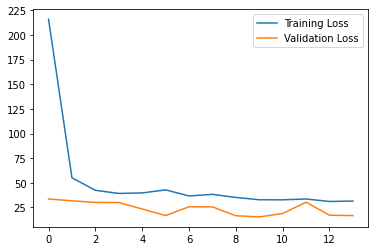

In [16]:
# Plot history

plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")

plt.legend()

plt.show()

In [17]:
# Testing

neural_network = load_model(checkpoint_filepath)

y_pred = neural_network.predict(X_test)

print(f'Mean Absolute Error = \u001b[32;1m{mean_absolute_error(y_test, y_pred)}\u001b[0m\n')
print(f'Mean Squared Error = \u001b[33;1m{mean_squared_error(y_test, y_pred)}\u001b[0m\n')
print(f'r2 score = \u001b[34;1m{r2_score(y_test, y_pred)}\u001b[0m')

Mean Absolute Error = 2.743543018341064

Mean Squared Error = 12.784991549543617

r2 score = 0.8704919934973099
